# Motivation

A few months ago, Facebook Research [released a model](https://github.com/facebookresearch/segment-anything) they named the **Segment Anything Model** (or **SAM** for short) for image segmentation, either taking a textual prompt and segmenting areas related to the prompt, or autmatically segmenting every discrete contiguous body of pixels.

It would be pretty neat to be able to engineer features like "trees per block", "cars per street", etc. To attempt that, I'll need very high resolution imagery. Fortunately, the NOAA [freely provides](https://coast.noaa.gov/digitalcoast/data/) such image data. They don't offer an image dataset that's limited just to Chicago. I could download all of the image tiles from their [latest Illinois release](https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/index.html), but each of these images is gigantic, so I'll have to figure out a way to find the URLs to just the image tiles I want.

In [1]:
#| code-fold: true
#| code-summary: Imports, Path definitions, and defining basic functions

from collections import Counter
import datetime as dt
from pathlib import Path
from typing import List, Tuple
from urllib.request import urlretrieve

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pyproj import CRS, Transformer
import rasterio
from rasterio.plot import show
import requests


PROJECT_DIR = Path(".").resolve()
PROJECT_DATA_DIR = PROJECT_DIR.joinpath("data")
PROJECT_DATA_DIR.mkdir(exist_ok=True)

output_dir = PROJECT_DATA_DIR.joinpath("IL_NAIP_2021_9599")
output_dir.mkdir(exist_ok=True)

def convert_image_bounds_to_4326(image_crs: rasterio.crs.CRS, image_bounds: rasterio.coords.BoundingBox) -> Tuple:
    transformer = Transformer.from_crs(CRS(image_crs), CRS("epsg:4326"))
    left, top = transformer.transform(image_bounds.left, image_bounds.top)
    right, bottom = transformer.transform(image_bounds.right, image_bounds.bottom)
    print(f"Lat, Lon of the upper left corner:   {left, top}")
    print(f"Lat, Lon of the bottom right corner: {right, bottom}")
    return (left, bottom, right, top)


def download_img_file(img_urls: List[str], output_dir: Path = output_dir) -> None:
    for img_url in img_urls:
        file_name = img_url.split("/")[-1]
        file_path = output_dir.joinpath(file_name)
        if not file_path.is_file():
            print(f"File {file_name} doesn't exist; downloading now")
            urlretrieve(img_url, file_path)
        else:
            print(f"File {file_name} already downloaded. Skipping redownload.")


In [2]:
#| code-fold: true
#| code-summary: Examining NOAA's data file list for the 2021-Illinois-4band-imagery dataset

il_2021_img_urls_url = "https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/urllist_2021_4BandImagery_Illinois_m9599.txt"
resp = requests.get(il_2021_img_urls_url)
if resp.status_code == 200:
    il_2021_img_urls = resp.text.split("\n")

print(f'.tif file urls:  {len([x for x in il_2021_img_urls if x.endswith(".tif")])}')
print(f"Total file urls: {len(il_2021_img_urls)}")
file_extension_counts = Counter([x.split(".")[-1] for x in il_2021_img_urls])
sorted_counts = sorted(file_extension_counts.items(), key=lambda ext: ext[1], reverse=True)
print("Counts of URLs by file extension (or content following a period)")
for file_ext, url_count  in sorted_counts:
    print(f"  - File extension: {file_ext: >22}, URL count: {url_count:>4}")

.tif file urls:  4131
Total file urls: 8285
Counts of URLs by file extension (or content following a period)
  - File extension:                    xml, URL count: 4149
  - File extension:                    tif, URL count: 4131
  - File extension:                    vrt, URL count:    2
  - File extension:                    zip, URL count:    1
  - File extension:  gov/inport/item/68085, URL count:    1
  - File extension:                       , URL count:    1


In [3]:
#| code-fold: true
#| code-summary: URLs for the non .tif or .xml files

print("Non .tif or .xml URLs:")
non_tif_or_xml_file_urls = [el for el in il_2021_img_urls if all(not el.endswith(ext) for ext in [".tif", ".xml"])]
for url in non_tif_or_xml_file_urls:
    print(f" - '{url}'")

Non .tif or .xml URLs:
 - 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_15.vrt'
 - 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_16.vrt'
 - 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/tile_index_IL_NAIP_2021_9599.zip'
 - 'https://www.fisheries.noaa.gov/inport/item/68085'
 - ''


`.vrt` files are Virtual Format files used by GDAL (the Geospatial Data Abstraction Library). I haven't looked at one before, and this full Illinois aerial imagery dataset is ~75GB, so let's take a look and see if we can't determine some pattern to the `.tif` filenaming that would enable me to avoid a massive download. And if the `.vrt` files aren't useful, I guess I can explore those ... 4149 `.xml` files for meaning.

In [4]:
#| code-fold: true
#| code-summary: Downloading a few .tif image files

dl_urls = [img_url for img_url in il_2021_img_urls if img_url.endswith(".tif")][0:3]
dl_file_names = [url.split("/")[-1] for url in dl_urls]
download_img_file(img_urls=dl_urls)

File m_3608906_ne_16_060_20210622.tif already downloaded. Skipping redownload.
File m_3608907_ne_16_060_20210617.tif already downloaded. Skipping redownload.
File m_3608907_nw_16_060_20210617.tif already downloaded. Skipping redownload.


In [5]:
#| code-fold: true
#| code-summary: Examining the size and names of those downloaded .tif files

!ls -lshtr {output_dir} | head -n 6

total 31G
1.6M -rw-rw-r-- 1 matt matt 1.6M Jul  1 20:31 il_naip_2021_15.vrt
5.1M -rw-rw-r-- 1 matt matt 5.1M Jul  1 20:31 il_naip_2021_16.vrt
454M -rw-rw-r-- 1 matt matt 454M Jul  1 20:31 m_3608906_ne_16_060_20210622.tif
431M -rw-rw-r-- 1 matt matt 431M Jul  1 20:31 m_3608907_ne_16_060_20210617.tif
422M -rw-rw-r-- 1 matt matt 422M Jul  1 20:31 m_3608907_nw_16_060_20210617.tif
ls: write error: Broken pipe


Oof.mp3, ~450MB per `.tif` (based on looking at the first 3), and there are 4131 `.tif` files. I guess before I try to figure out the naming structure, I should see if the image data is adequate to resolve buildings.

## Question 1: Is the image resolution fine enough that we can resolve buildings?

In [6]:
#| code-fold: true
#| code-summary: Examining assorted metadata in one of these .tif image files

file_path = output_dir.joinpath(dl_file_names[2])
with rasterio.open(file_path) as src:
    orig_crs = src.crs
    orig_bounds = src.bounds
    bands = src.read()
    print(f"File name: {file_path.name}")
    print(f"Transforms: {src.transform}")
    print(f"CRS:        {orig_crs}")
    print(f"Resolution: {src.res}")
    print(f"units:      {src.crs.linear_units}")
    print(f"bounds:     {orig_bounds}")
    print(f"indexes:    {src.indexes}")
    print(f"# of bands: {src.count}")
    print(f"Shape of imagery array: {bands.shape}")
    _ = convert_image_bounds_to_4326(image_crs=orig_crs, image_bounds=orig_bounds)

File name: m_3608907_nw_16_060_20210617.tif
Transforms: | 0.60, 0.00, 299327.40|
| 0.00,-0.60, 4097538.60|
| 0.00, 0.00, 1.00|
CRS:        EPSG:26916
Resolution: (0.6, 0.6)
units:      metre
bounds:     BoundingBox(left=299327.4, bottom=4089928.2, right=305696.4, top=4097538.6)
indexes:    (1, 2, 3, 4)
# of bands: 4
Shape of imagery array: (4, 12684, 10615)
Lat, Lon of the upper left corner:   (37.002598910956365, -89.25526907292884)
Lat, Lon of the bottom right corner: (36.93538410568418, -89.18177942773526)


From the above printout, we see:

* the rasters in this dataset use projected coordinate reference system (CRS) EPSG 26916,
* that projected CRS uses units of meters,
* one pixel represents a 0.6m x 0.6m area (i.e. the resolution is 0.6m x 0.6m), and
* the `bands` variable contains four stacked image arrays that are 12684 pixels by 10615 pixels

So each image should show a ~7.5 km by ~6.5 km area and have more than enough resolution to distinguish buildings from surrounding easments and infrastructure.

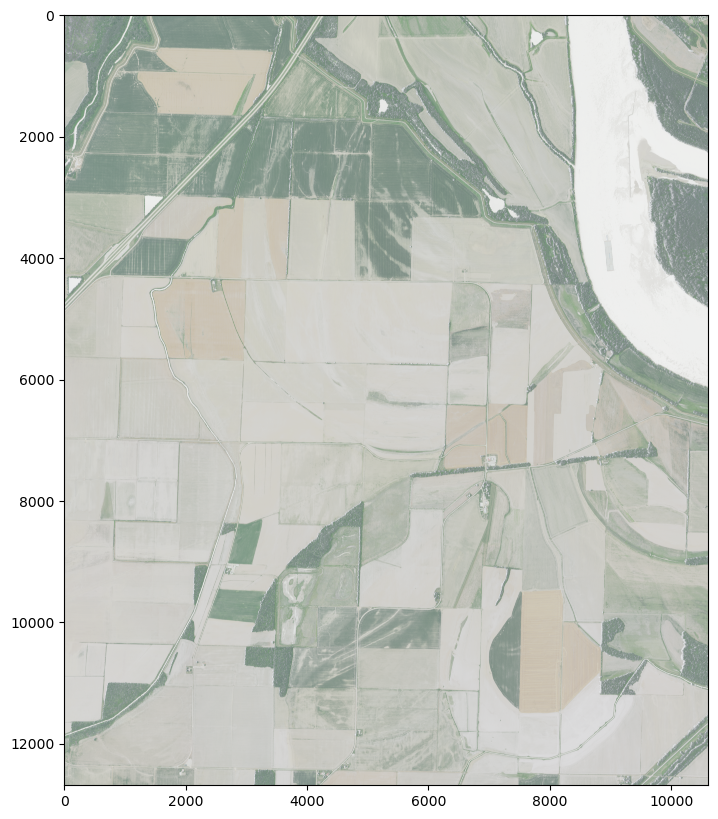

In [7]:
#| code-fold: true
#| code-summary: Showing the .tif image

plt.figure(figsize=(10,10))
_ = show(bands)

That image is pretty faded. Let's look at the color-interpretation metadata and make prettier maps.

In [8]:
#| code-fold: true
#| code-summary: Examining the color-interpretation metadata in the .tif image

with rasterio.open(file_path) as src:
    print(f"Color interpretation for bands:\n  {src.colorinterp}")

Color interpretation for bands:
  (<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.undefined: 0>)


Ok, so the 4 bands represent [red, green, blue, non-color-data]. Let's account for that.

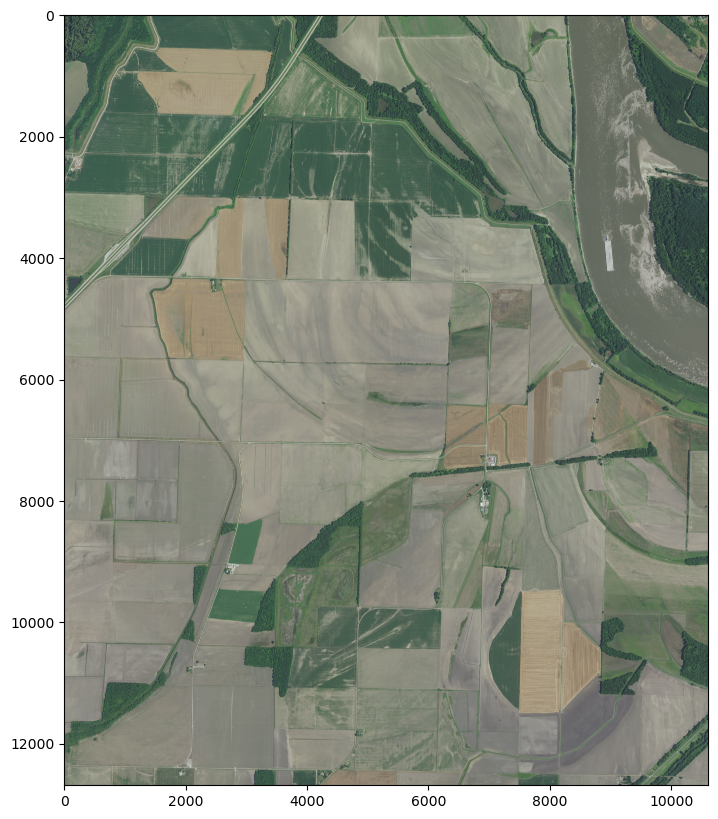

In [9]:
#| code-fold: true
#| code-summary: Developing a display function with proper color-interpretation

file_path=file_path
fig_width = 10

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
with rasterio.open(file_path) as src:
    r = src.read(1)
    g = src.read(2)
    b = src.read(3)
    rgb = np.stack((r, g, b))
    show(rgb, ax=ax)

We saw above that a pixel corresponds to about 0.6m of linear distance, so we should definately be able to see buildings, but many human-scale things (like cars) may only a few pixels wide. Let's blow up an image and really get a sense for the max resolution.

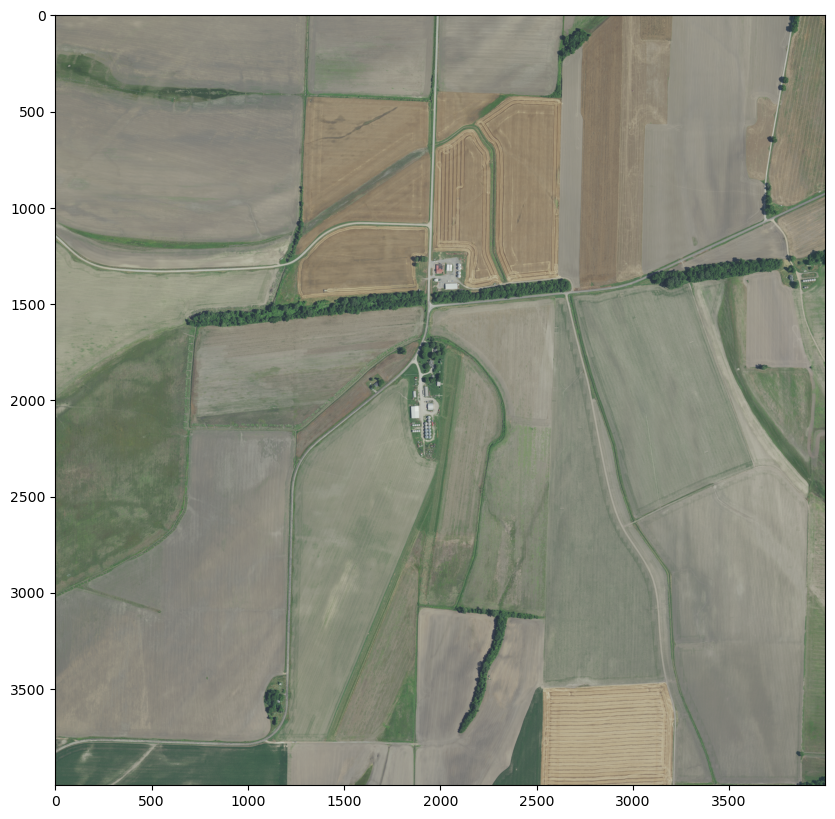

In [10]:
#| code-fold: true
#| code-summary: Zooming in on the north-south cluster of buildings

file_path=file_path
fig_width = 10

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
with rasterio.open(file_path) as src:
    window = rasterio.windows.Window(col_off=5000, row_off=6000, width=4000, height=4000)
    r = src.read(1, window=window)
    g = src.read(2, window=window)
    b = src.read(3, window=window)
    rgb = np.stack((r, g, b))
    show(rgb, ax=ax)

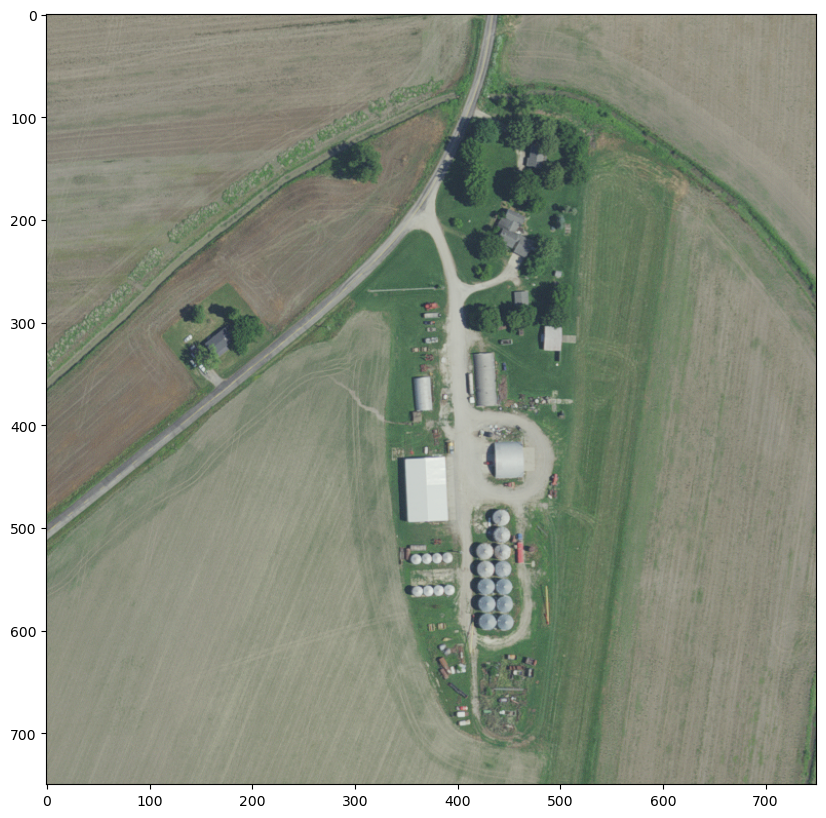

In [11]:
#| code-fold: true
#| code-summary: Zooming in much tighter on the north-south cluster of buildings

file_path=file_path
fig_width = 10

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
with rasterio.open(file_path) as src:
    window = rasterio.windows.Window(col_off=6500, row_off=7600, width=750, height=750)
    r = src.read(1, window=window)
    g = src.read(2, window=window)
    b = src.read(3, window=window)
    rgb = np.stack((r, g, b))
    show(rgb, ax=ax)

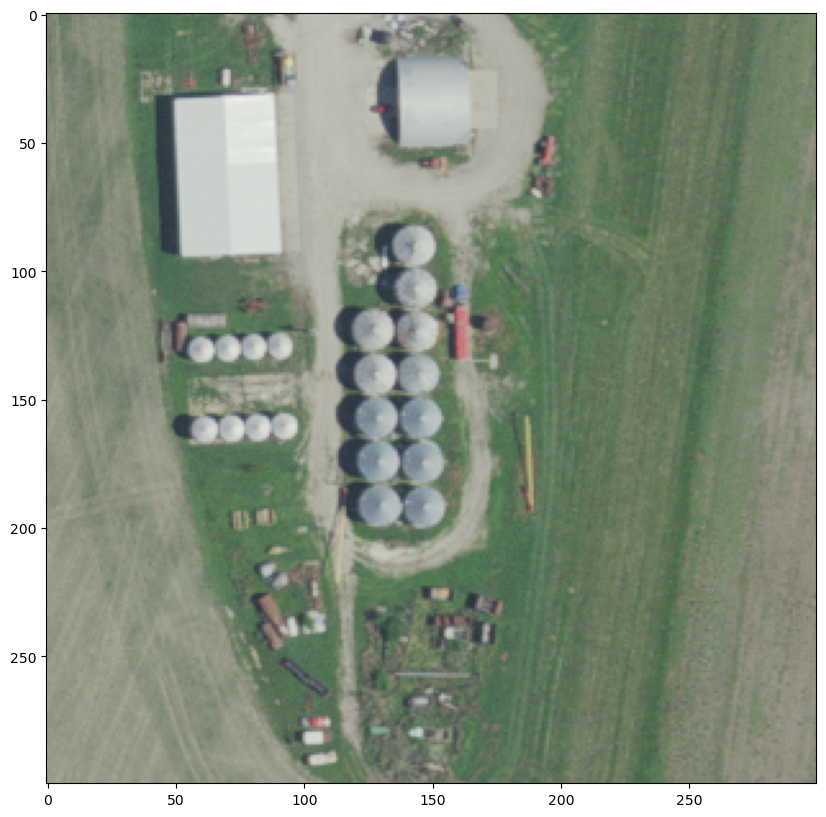

In [12]:
#| code-fold: true
#| code-summary: Zooming in to the extent of much tighter on the north-south cluster of buildings

file_path=file_path
fig_width = 10

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
with rasterio.open(file_path) as src:
    window = rasterio.windows.Window(col_off=6800, row_off=8000, width=300, height=300)
    r = src.read(1, window=window)
    g = src.read(2, window=window)
    b = src.read(3, window=window)
    rgb = np.stack((r, g, b))
    show(rgb, ax=ax)

### Answer 1: Yes, we can easily resolve small buildings

Cross-referencing with Google maps, we see that cars (like the red one in the shadow of the structure top-center in the above image) are barely discernable, but we can clearly make out buildings and trees.

![](imgs/google_maps_zoomed_in_cross_reference.png)

In [13]:
#| code-fold: true
#| code-summary: Encapsulating logic for downloading, extracting, and displaying .tifs

def download_tif_and_extract_bands(dl_filename: str, full_url_list: List = il_2021_img_urls, output_dir: Path = output_dir) -> np.ndarray:
    filename_subset = [el for el in full_url_list if el.endswith(dl_filename)]
    download_img_file(output_dir=output_dir, img_urls=filename_subset)
    file_path = output_dir.joinpath(dl_filename)

    with rasterio.open(file_path) as src:
        orig_crs = src.crs
        orig_bounds = src.bounds
        bands = src.read()
        print(f"File name:  {file_path.name}")
        print(f"bounds:     {orig_bounds}")
        print(f"Shape of imagery array: {bands.shape}")
        _ = convert_image_bounds_to_4326(image_crs=orig_crs, image_bounds=orig_bounds)
    return bands

def plot_raster_image(file_path: Path, fig_width: int = 10) -> None:
    fig, ax = plt.subplots(figsize=(fig_width, fig_width))
    with rasterio.open(file_path) as src:
        r = src.read(1)
        g = src.read(2)
        b = src.read(3)
        rgb = np.stack((r, g, b))
        show(rgb, ax=ax)

Now that we know that the data can support the research task, let's try to find images relevant to the research goal (namely, let's find images of Chicago). These `.tif` files are gigantic, so let's explore the metadata for order we can exploit to guide us. From the counts of file-extentions above, ~99.9% of the URLs in this dataset's manifest were either `.tif` or `.xml` files, and there were a few other URLs, two for `.vrt` files and one `.zip` file.

## Question 2: What does `.vrt` file data look like, and can I use it to determine the images covering Chicago

In [14]:
#| code-fold: true
#| code-summary: Examining the first ~20 lines in one of the .vrt files

with open(output_dir.joinpath("il_naip_2021_15.vrt")) as f:
    vrt_lines = f.readlines()
print("".join(vrt_lines[0:20]))

<VRTDataset rasterXSize="236571" rasterYSize="857074">
  <SRS>PROJCS["NAD83 / UTM zone 15N",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],TOWGS84[0,0,0,0,0,0,0],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-93],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","26915"]]</SRS>
  <GeoTransform>  6.2200080000000005e+05,  6.0000000000001086e-01,  0.0000000000000000e+00,  4.7169515999999996e+06,  0.0000000000000000e+00, -6.0000000000001086e-01</GeoTransform>
  <VRTRasterBand dataType="Byte" band="1">
    <ColorInterp>Red</ColorInterp>
    <SimpleSource>
      <SourceFi

That looks like XML, which is very structured. After the opening `VRTDataset` tag, we see tags `<SRS>` (with CRS, projection, unit, orientation, etc metadata for the image data), `<GEOTRANSFORM>` (presumably providing the affine transformation matrix to transform from some reference), and then the start tag of a `<VRTRasterBand>` set (presumably for the band describing the red pixel mask values) of `<SimpleSource>` tags.

Let's try parsing those `<SimpleSource>` elements to an easier-to-search data structure, the DataFrame.

In [15]:
#| code-fold: true
#| code-summary: Code to extract and structure data from these .vrt files

import xml.etree.ElementTree as ET

def parse_simple_sources_from_vrt_file(vrt_file_path: Path) -> pd.DataFrame:
    tree = ET.parse(vrt_file_path)
    root = tree.getroot()

    vrt_data = []
    for source in root.iter("SimpleSource"):
        src_filename = source.find("SourceFilename").text
        src_band = source.find("SourceBand").text
        src_properties = source.find("SourceProperties").attrib
        src_rect = source.find("SrcRect").attrib
        dst_rect = source.find("DstRect").attrib
        vrt_data.append({
            "SourceFilename": src_filename,
            "SourceBand": int(src_band),
            "RasterXSize": int(src_properties["RasterXSize"]),
            "RasterYSize": int(src_properties["RasterYSize"]),
            "DataType": src_properties["DataType"],
            "BlockXSize": int(src_properties["BlockXSize"]),
            "BlockYSize": int(src_properties["BlockYSize"]),
            "src_x_off": int(src_rect["xOff"]),
            "src_y_off": int(src_rect["yOff"]),
            "src_x_size": int(src_rect["xSize"]),
            "src_y_size": int(src_rect["ySize"]),
            "dst_x_off": int(dst_rect["xOff"]),
            "dst_y_off": int(dst_rect["yOff"]),
            "dst_x_size": int(dst_rect["xSize"]),
            "dst_y_size": int(dst_rect["ySize"]),
        })
    return pd.DataFrame(vrt_data)

def filter_vrt_df_to_offset_spans(
    min_x: int, max_x: int, min_y: int, max_y: int, vrt_df: pd.DataFrame,
    keep_cols = ["SourceFilename", "dst_x_off", "dst_y_off"]
) -> pd.DataFrame:
    df_subset = vrt_df.loc[
        (
            (vrt_df["dst_x_off"] >= min_x) & (vrt_df["dst_x_off"] <= max_x) &
            (vrt_df["dst_y_off"] >= min_y) & (vrt_df["dst_y_off"] <= max_y)
        ),
        keep_cols
    ].sort_values(by="dst_x_off")
    return df_subset

In [16]:
#| code-fold: true
#| code-summary: Examining the structured data from vrt files

vrt_15_df = parse_simple_sources_from_vrt_file(
    vrt_file_path=output_dir.joinpath("il_naip_2021_15.vrt")
)
print(f"Source files referenced in the '15' vrt file: {len(vrt_15_df)}")
display(vrt_15_df.head(2))

vrt_16_df = parse_simple_sources_from_vrt_file(
    vrt_file_path=output_dir.joinpath("il_naip_2021_16.vrt")
)
print(f"Source files referenced in the '16' vrt file: {len(vrt_16_df)}")
display(vrt_16_df.head(2))

Source files referenced in the '15' vrt file: 3868


,SourceFilename,SourceBand,RasterXSize,RasterYSize,DataType,BlockXSize,BlockYSize,src_x_off,src_y_off,src_x_size,src_y_size,dst_x_off,dst_y_off,dst_x_size,dst_y_size
0,m_3709008_ne_15_060_20210616.tif,1,10445,12759,Byte,10445,1,0,0,10445,12759,226126,844315,10445,12759
1,m_3809003_ne_15_060_20210704.tif,1,10249,12700,Byte,10249,1,0,0,10249,12700,129996,661987,10249,12700


Source files referenced in the '16' vrt file: 12656


,SourceFilename,SourceBand,RasterXSize,RasterYSize,DataType,BlockXSize,BlockYSize,src_x_off,src_y_off,src_x_size,src_y_size,dst_x_off,dst_y_off,dst_x_size,dst_y_size
0,m_3608906_ne_16_060_20210622.tif,1,10475,12686,Byte,10475,1,0,0,10475,12686,96991,1032135,10475,12686
1,m_3608907_ne_16_060_20210617.tif,1,10459,12674,Byte,10459,1,0,0,10459,12674,115547,1032573,10459,12674


,SourceFilename,dst_x_off,dst_y_off
3026,m_4208925_sw_16_060_20210918.tif,29303,0


File m_4208925_sw_16_060_20210918.tif already downloaded. Skipping redownload.
File name:  m_4208925_sw_16_060_20210918.tif
bounds:     BoundingBox(left=253192.2, bottom=4709173.8, right=259211.40000000002, top=4716951.6)
Shape of imagery array: (4, 12963, 10032)
Lat, Lon of the upper left corner:   (42.56552458440836, -90.00678751628385)
Lat, Lon of the bottom right corner: (42.49747091858195, -89.93027728345706)


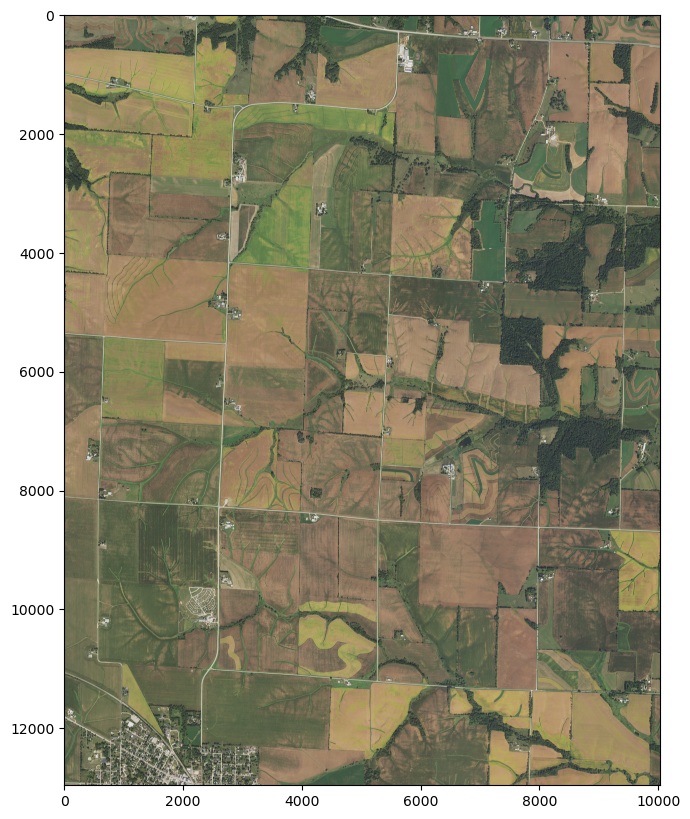

In [17]:
#| code-fold: true
#| code-summary: Varying offsets to find images bounding the corners of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=0, max_x=31000, min_y=0, max_y=10000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

Chicago is roughly bounded by (42.05, -87.95) to (41.65, -87.55), so filtering to the minimum y-offset in the vrt_16 file gets us pretty close, but from inspection, that level of ruralness is pretty far from Chicago.

,SourceFilename,dst_x_off,dst_y_off
2226,m_4108701_nw_16_060_20210908.tif,301986,110654


File m_4108701_nw_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4108701_nw_16_060_20210908.tif
bounds:     BoundingBox(left=416802.0, bottom=4643016.600000001, right=422700.0, top=4650559.2)
Shape of imagery array: (4, 12571, 9830)
Lat, Lon of the upper left corner:   (42.00265573776309, -88.00462897145327)
Lat, Lon of the bottom right corner: (41.93533185561142, -87.93242799924842)


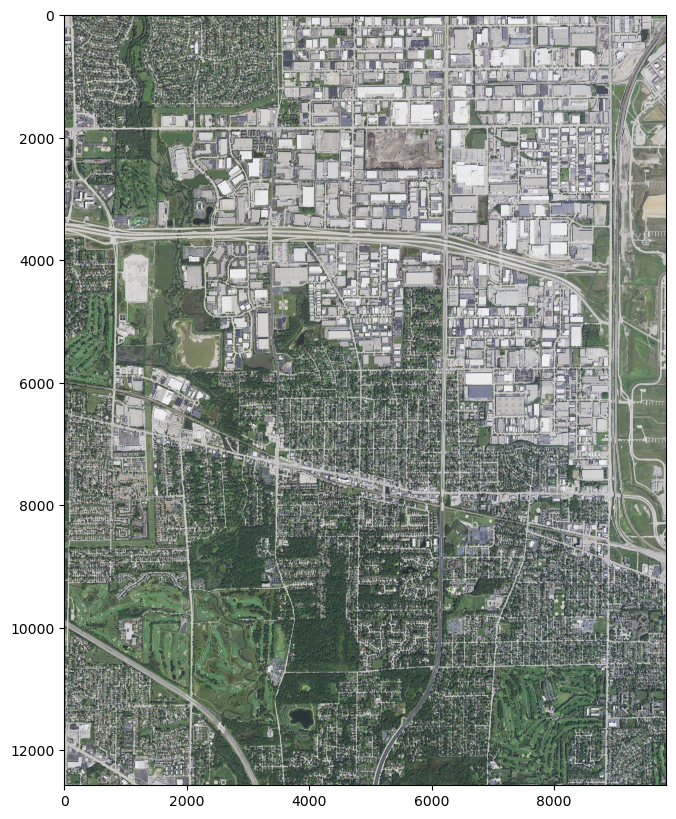

In [18]:
#| code-fold: true
#| code-summary: Varying offsets to find images bounding the corners of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=300000, max_x=310000, min_y=110000, max_y=115000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

Now that we have a few (`dst_x_off`, `dst_y_off`) + (`longitude`, `latitude`) pairs, let's do a little back-of-the-envelope math to figure out how 1 unit of `dst_x_off` or `dst_y_off` corresponds to longitude or latitude respectively.

From middle school algebra, we know that (for linear relationships) slope is given by rise over run.

$$ m = \frac{\Delta y }{\Delta x} = \frac{y_2 - y_1}{x_2 - x_1} $$

Here, rise is the change in latitude, run is the change in longitude. As we have two images with two sets of latitude and longitude pairs, we can calculate the slope. And as we know the latitude and longitude of Chicago, we can use that slope and one of our known (lat, long) pairs to estimate the approximate `dst_x_off` and `dst_y_off` values for corners bounding Chicago.



dst_x_off: 29303, dst_y_off: 0

* Lat, Lon of the upper left corner:   (42.56552458440836, -90.00678751628385)
* Lat, Lon of the bottom right corner: (42.49747091858195, -89.93027728345706)

dst_x_off: 301986, dst_y_off: 110654

* Lat, Lon of the upper left corner:   (42.00265573776309, -88.00462897145327)
* Lat, Lon of the bottom right corner: (41.93533185561142, -87.93242799924842)

In [19]:
#| code-fold: true
#| code-summary: Back of the envelope math to estimate offsets for Chicago's bounding box

dst_x_off_1 = 301986
dst_y_off_1 = 110654
ll_tl_1 = (42.00265573776309, -88.00462897145327)
ll_lb_1 = (41.93533185561142, -87.93242799924842)
lat_1 = (ll_tl_1[0] + ll_lb_1[0]) / 2
lon_1 = (ll_tl_1[1] + ll_lb_1[1]) / 2

dst_x_off_2 = 29303
dst_y_off_2 = 0
ll_tl_2 = (42.56552458440836, -90.00678751628385)
ll_lb_2 = (42.49747091858195, -89.93027728345706)
lat_2 = (ll_tl_2[0] + ll_lb_2[0]) / 2
lon_2 = (ll_tl_2[1] + ll_lb_2[1]) / 2

delta_x_off = dst_x_off_2 - dst_x_off_1
delta_y_off = dst_y_off_2 - dst_y_off_1
delta_lat = lat_2 - lat_1
delta_lon = lon_2 - lon_1

x_slope = delta_lon / delta_x_off
y_slope = delta_lat / delta_y_off

print(f"Change in longitude per 1 unit of dst_x_off: {x_slope}")
print(f"Change in latitude per 1 unit of dst_y_off:  {y_slope}")

for x_offset in range(250000, 400000, 10000):
    print(f"longitude w dst_x_off {x_offset}: {lon_2 + x_slope * x_offset}")
print("------------------------------------------------ ")
for y_offset in range(100000, 200000, 10000):
    print(f"latitude w dst_y_off {y_offset}: {lat_2 + y_slope * y_offset}")

Change in longitude per 1 unit of dst_x_off: 7.334538326626925e-06
Change in latitude per 1 unit of dst_y_off:  -5.083448902054101e-06
longitude w dst_x_off 250000: -88.13489781821373
longitude w dst_x_off 260000: -88.06155243494746
longitude w dst_x_off 270000: -87.98820705168119
longitude w dst_x_off 280000: -87.91486166841491
longitude w dst_x_off 290000: -87.84151628514864
longitude w dst_x_off 300000: -87.76817090188237
longitude w dst_x_off 310000: -87.69482551861611
longitude w dst_x_off 320000: -87.62148013534984
longitude w dst_x_off 330000: -87.54813475208357
longitude w dst_x_off 340000: -87.4747893688173
longitude w dst_x_off 350000: -87.40144398555103
longitude w dst_x_off 360000: -87.32809860228477
longitude w dst_x_off 370000: -87.2547532190185
longitude w dst_x_off 380000: -87.18140783575222
longitude w dst_x_off 390000: -87.10806245248595
------------------------------------------------ 
latitude w dst_y_off 100000: 42.023152861289745
latitude w dst_y_off 110000: 41.97

,SourceFilename,dst_x_off,dst_y_off
2373,m_4108807_ne_16_060_20210928.tif,276149,110324


File m_4108807_ne_16_060_20210928.tif already downloaded. Skipping redownload.
File name:  m_4108807_ne_16_060_20210928.tif
bounds:     BoundingBox(left=401299.8, bottom=4643203.8, right=407130.0, top=4650757.2)
Shape of imagery array: (4, 12589, 9717)
Lat, Lon of the upper left corner:   (42.00264796207355, -88.19181782437538)
Lat, Lon of the bottom right corner: (41.93533894952825, -88.12023834528422)


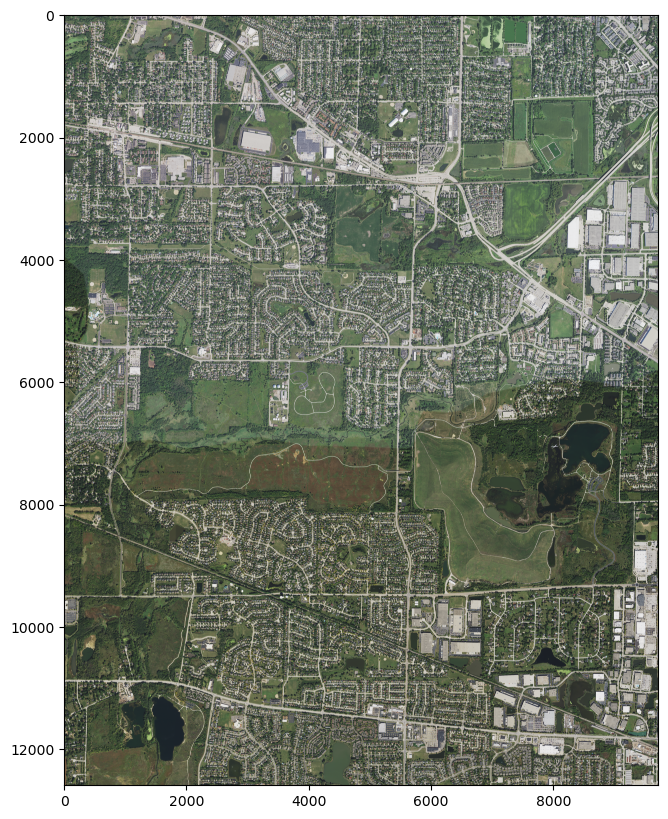

In [20]:
#| code-fold: true
#| code-summary: Using our estimates to try to find the offsets for the northwest corner of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=270000, max_x=310000, min_y=110000, max_y=110400, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

Ok, our calculations got us pretty close, although clearly we were a bit short in the x-direction.

Ding ding ding! That's Montrose Beach! We're in Chicago with {`dst_x_off`: 345232, `dst_y_off`: 111079}

,SourceFilename,dst_x_off,dst_y_off
2233,m_4108703_ne_16_060_20210908.tif,345232,111079


File m_4108703_ne_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4108703_ne_16_060_20210908.tif
bounds:     BoundingBox(left=442749.6, bottom=4642780.8, right=448539.6, top=4650304.2)
Shape of imagery array: (4, 12539, 9650)
Lat, Lon of the upper left corner:   (42.002673723730645, -87.69130950207042)
Lat, Lon of the bottom right corner: (41.935316313647476, -87.62074015029482)


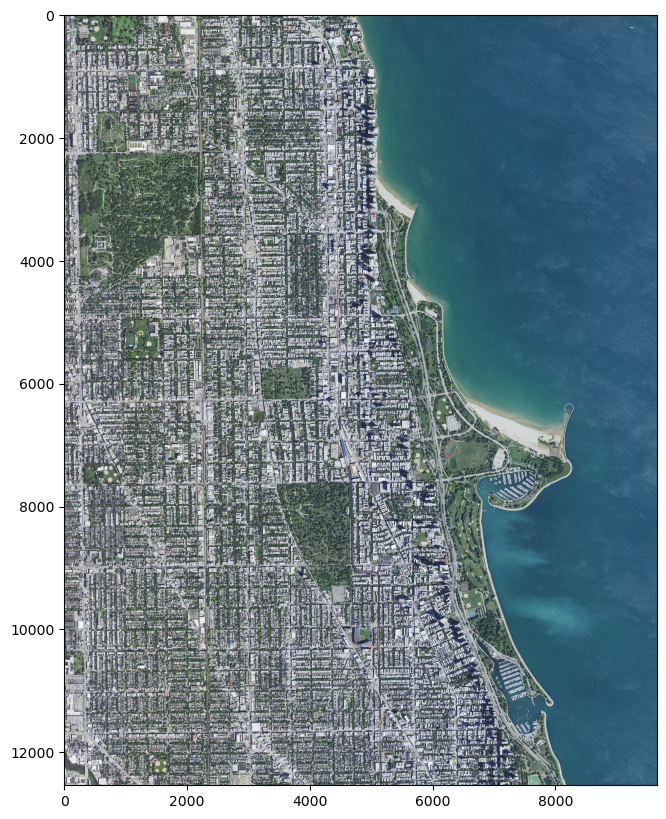

In [21]:
#| code-fold: true
#| code-summary: Using our estimates to try to find the offsets for the northwest corner of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=340000, max_x=350000, min_y=110000, max_y=120000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

Oh rats, O'Hare is split in two. Well, O'Hare marks the western-most point in Chicago, and it's nearly the northern-most point.

,SourceFilename,dst_x_off,dst_y_off
2225,m_4108701_ne_16_060_20210908.tif,310691,110752
2887,m_4208757_se_16_060_20210908.tif,310816,99094


File m_4208757_se_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4208757_se_16_060_20210908.tif
bounds:     BoundingBox(left=422100.0, bottom=4649845.8, right=427906.2, top=4657495.2)
Shape of imagery array: (4, 12749, 9677)
Lat, Lon of the upper left corner:   (42.06565922520393, -87.9415848800517)
Lat, Lon of the bottom right corner: (41.99732626080149, -87.8704724306422)
File m_4108701_ne_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4108701_ne_16_060_20210908.tif
bounds:     BoundingBox(left=422025.0, bottom=4642962.0, right=427834.8, top=4650500.4)
Shape of imagery array: (4, 12564, 9683)
Lat, Lon of the upper left corner:   (42.002660830466866, -87.94156106696074)
Lat, Lon of the bottom right corner: (41.93532640993883, -87.87049010245049)


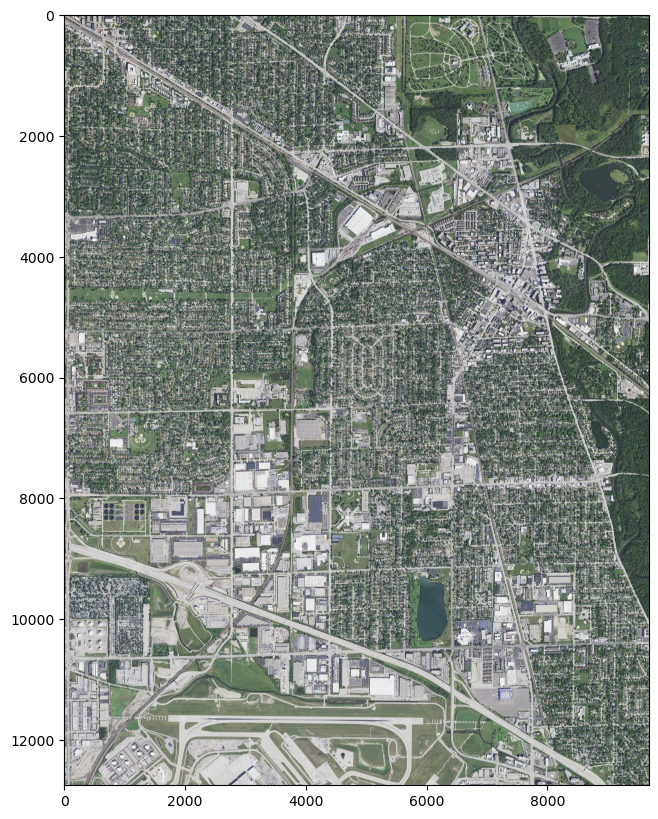

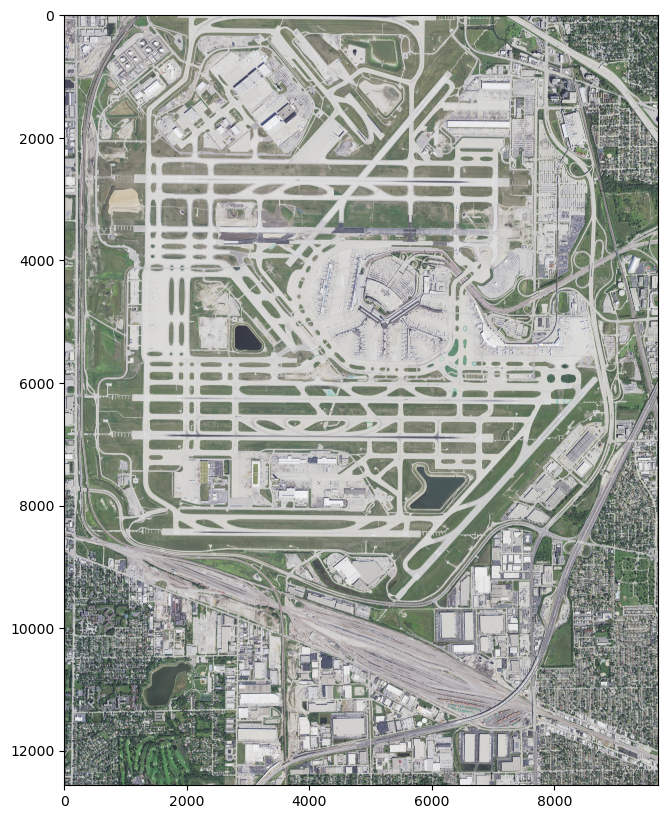

In [22]:
#| code-fold: true
#| code-summary: Adjusting offsets to get O'Hare International Airport, the northwest corner of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=310000, max_x=315000, min_y=90000, max_y=120000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name1 = df_subset["SourceFilename"].unique()[1]
file_path1 = output_dir.joinpath(file_name1)
_ = download_tif_and_extract_bands(dl_filename=file_name1)

file_name0 = df_subset["SourceFilename"].unique()[0]
file_path0 = output_dir.joinpath(file_name0)
_ = download_tif_and_extract_bands(dl_filename=file_name0)

plot_raster_image(file_path=file_path1, fig_width=10)
plot_raster_image(file_path=file_path0, fig_width=10)

And there's Lake Calumet (that oddly-shaped body of water near the top). While not exactly the southeastern corner of Chicago, it's very close, so we know the extents of Chicago are roughly 310000 to 360000 in `dst_x_off` units, and 90000 to 170000 in `dst_y_off` units.

,SourceFilename,dst_x_off,dst_y_off
2268,m_4108720_sw_16_060_20210908.tif,353377,168879


File m_4108720_sw_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4108720_sw_16_060_20210908.tif
bounds:     BoundingBox(left=447636.6, bottom=4607994.0, right=453530.39999999997, top=4615624.2)
Shape of imagery array: (4, 12717, 9823)
Lat, Lon of the upper left corner:   (41.69067319541816, -87.62923384329923)
Lat, Lon of the bottom right corner: (41.62231527376006, -87.5578195678046)


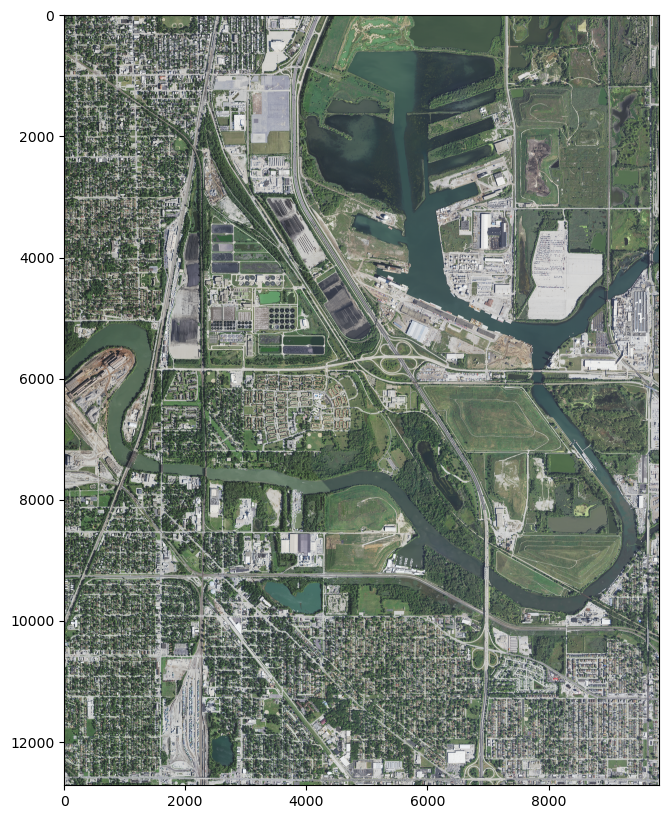

In [23]:
#| code-fold: true
#| code-summary: Adjusting offsets to get Lake Calumet, (very nearly) the southeast corner of Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=350000, max_x=360000, min_y=160000, max_y=170000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

And that's probably the best image of downtown.

,SourceFilename,dst_x_off,dst_y_off
2235,m_4108703_se_16_060_20210908.tif,345139,122552


File m_4108703_se_16_060_20210908.tif already downloaded. Skipping redownload.
File name:  m_4108703_se_16_060_20210908.tif
bounds:     BoundingBox(left=442693.8, bottom=4635786.0, right=448489.2, top=4643420.4)
Shape of imagery array: (4, 12724, 9659)
Lat, Lon of the upper left corner:   (41.940673761594084, -87.69131260636372)
Lat, Lon of the bottom right corner: (41.87231581185974, -87.62073763881713)


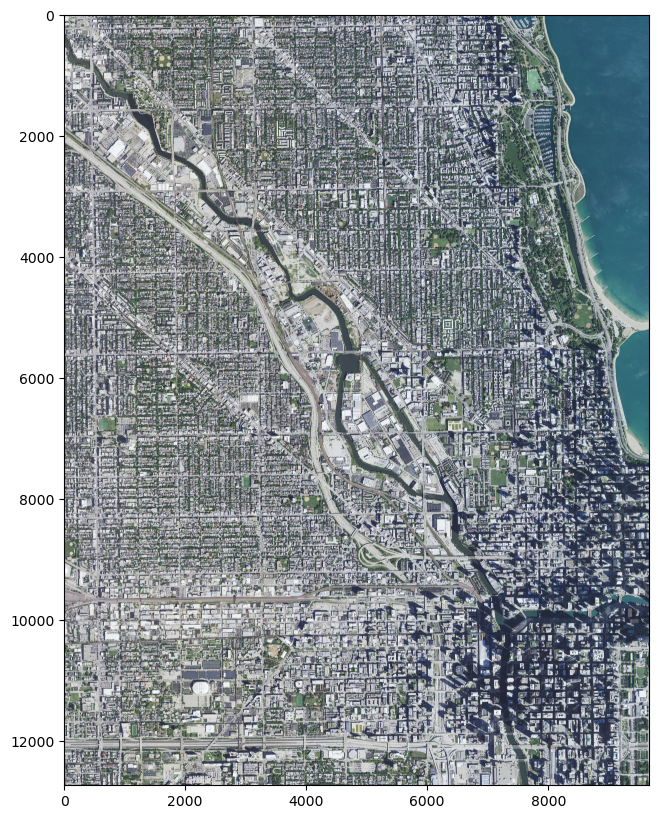

In [24]:
#| code-fold: true
#| code-summary: Adjusting offsets to get downtown Chicago

df_subset = filter_vrt_df_to_offset_spans(
    min_x=340000, max_x=350000, min_y=120000, max_y=130000, vrt_df=vrt_16_df
)
display(df_subset.drop_duplicates(subset="SourceFilename"))
file_name = df_subset["SourceFilename"].unique()[0]
file_path = output_dir.joinpath(file_name)
_ = download_tif_and_extract_bands(dl_filename=file_name)
plot_raster_image(file_path=file_path, fig_width=10)

In [25]:
#| code-fold: true
#| code-summary: Downloading the images in the offsets bounded by the northwest and southeast corners

chicago_subset = filter_vrt_df_to_offset_spans(
    min_x=310000, max_x=360000, min_y=90000, max_y=170000, vrt_df=vrt_16_df
)
chicago_img_urls = [
    url for url in il_2021_img_urls if any(url.endswith(fn) for fn in chicago_subset["SourceFilename"])
]
print(f"Number of images in the Chicago dst_xy_offset bounds: {len(chicago_img_urls)}")
download_img_file(img_urls=chicago_img_urls)

Number of images in the Chicago dst_xy_offset bounds: 40
File m_4108701_ne_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108701_se_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108702_ne_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108702_nw_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108702_se_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108702_sw_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108703_ne_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108703_nw_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108703_se_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108703_sw_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108704_sw_16_060_20210908.tif already downloaded. Skipping redownload.
File m_4108709_ne_16_060_20210908.tif already downloaded. Skipping redownl

### Answer 2: yes, there was usable order, although it was a bit of a chore

## Question 3: What is in the zipped tile-index file, and can I use it to determine the images covering Chicago

While not really necessary anymore, let's take a look at the zipped file. Based on the file name, I suspect I should have gone with this one first.

In [26]:
#| code-fold: true
#| code-summary: Examining the contents of the tile-index file

from zipfile import ZipFile

zip_file_name = non_tif_or_xml_file_urls[2].split("/")[-1]
zip_file_path = output_dir.joinpath(zip_file_name)
with ZipFile(zip_file_path) as zf:
    for filename in zf.namelist():
        print(f"File Name: {zf.getinfo(filename)}")

File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shp' filemode='-rw-rw-r--' file_size=561916>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.dbf' filemode='-rw-rw-r--' file_size=582569>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shx' filemode='-rw-rw-r--' file_size=33148>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.prj' filemode='-rw-rw-r--' file_size=167>


Oh, it's a shapefile.

In [27]:
#| code-fold: true
#| code-summary: Loading the tile-index shapefile file

import geopandas as gpd

gdf = gpd.read_file(f"zip://{zip_file_path}!tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shp")
print(f"Image tiles in all of Illinois: {len(gdf)}")
display(gdf.head(3))

Image tiles in all of Illinois: 4131


,filename,url,geometry
0,m_3608906_ne_16_060_20210622.tif,https://coastalimagery.blob.core.windows.net/d...,"POLYGON ((-89.24674 36.93539, -89.31525 36.935..."
1,m_3608907_ne_16_060_20210617.tif,https://coastalimagery.blob.core.windows.net/d...,"POLYGON ((-89.12173 36.93538, -89.19025 36.935..."
2,m_3608907_nw_16_060_20210617.tif,https://coastalimagery.blob.core.windows.net/d...,"POLYGON ((-89.18374 36.93539, -89.25325 36.935..."


Images corresponding to the Chicago blue area: 50


/tmp/ipykernel_511979/984697602.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (gdf.geometry.centroid.x >= -88) & (gdf.geometry.centroid.x <= -87.50) &
/tmp/ipykernel_511979/984697602.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (gdf.geometry.centroid.x >= -88) & (gdf.geometry.centroid.x <= -87.50) &
/tmp/ipykernel_511979/984697602.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  (gdf.geometry.centroid.y >= 41.60) & (gdf.geometry.centroid.y <= 42.05)
/tmp/ipykernel_511979/984697602.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid'

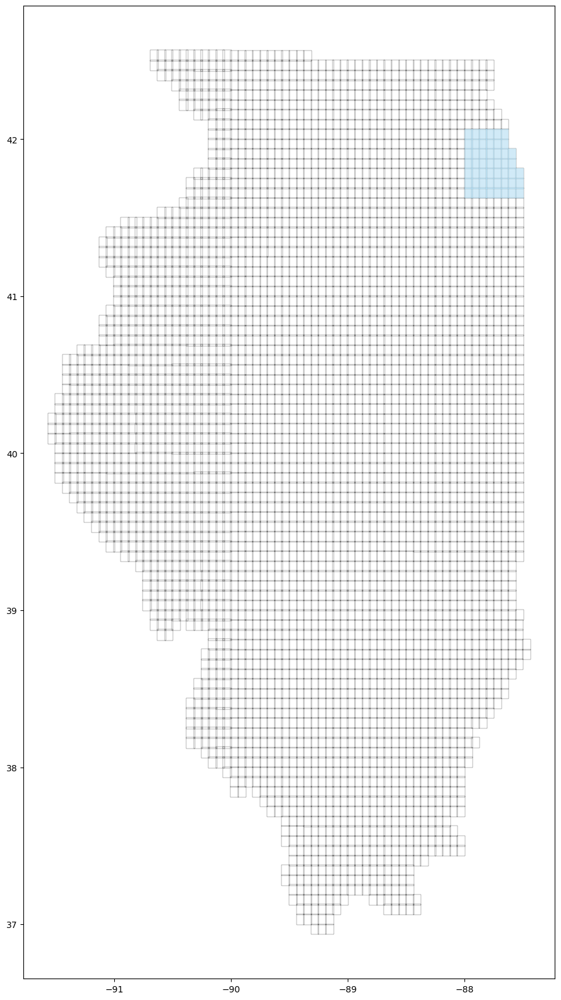

In [28]:
#| code-fold: true
#| code-summary: Mapping out tile boundaries and coloring Chicago tiles
#| warning: false

fig_width = 20
chicago_tiles_gdf = gdf.loc[
    (gdf.geometry.centroid.x >= -88) & (gdf.geometry.centroid.x <= -87.50) &
    (gdf.geometry.centroid.y >= 41.60) & (gdf.geometry.centroid.y <= 42.05)
].copy()

print(f"Images corresponding to the Chicago blue area: {len(chicago_tiles_gdf)}")

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax = gdf.plot(facecolor="none", linewidth=fig_width*0.01, ax=ax)
ax = chicago_tiles_gdf.plot(facecolor="#B3DDF2", alpha=0.6, ax=ax)

Oh man, that's was much easier.

### Answer 3: The zipped tile-index file seems to be primarily intended as an aid for finding images covering areas of interest

I'm really kicking myself for not checking the zip file first; the name really hinted at the purpose. But in addition to learning the hard way that NOAA provides helpful shapefiles that map out tiles, we've collected the images that cover Chicago, and learned a bit about the `.vrt` file type.

That's enough for this post, but in the near future, I'll see if I can segment these images with a model like [SAM](https://github.com/facebookresearch/segment-anything) or [FastSAM](https://github.com/casia-iva-lab/fastsam). Even if these images do prove to be too much to segment in a reasonable amount of time (with my hardware; a many-cored system with a 12GB VRAM CUDA-enabled GPU and 64 GB DRAM), it's just a matter of time until even more performant implementations emerge.